In [ ]:
import albumentations as A
import cv2
import numpy as np
from google.colab import drive
import glob
import imgaug
import random
from matplotlib import pyplot as plt
import tensorflow as tf

AUTOTUNE = tf.data.experimental.AUTOTUNE
local = True

fix random seeds so this repeatable

In [ ]:
imgaug.random.seed(123)
random.seed(7)

set image size for classification

In [ ]:
image_size = 512

create transforms to augment data

In [ ]:
mult = -(image_size//-9)
transform = A.Compose([
    A.RandomScale(scale_limit=.1),
    A.Resize(9*mult,16*mult),
    A.RandomCrop(width=image_size, height=image_size),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=.5,brightness_limit=.3,contrast_limit=.3),
])
testtransform = A.Compose([
    A.Resize(9*mult,16*mult),
    A.CenterCrop(width=image_size, height=image_size),
])

mount google drive with data

In [ ]:
if not local:
  drive.mount('/content/drive')

test albumenations

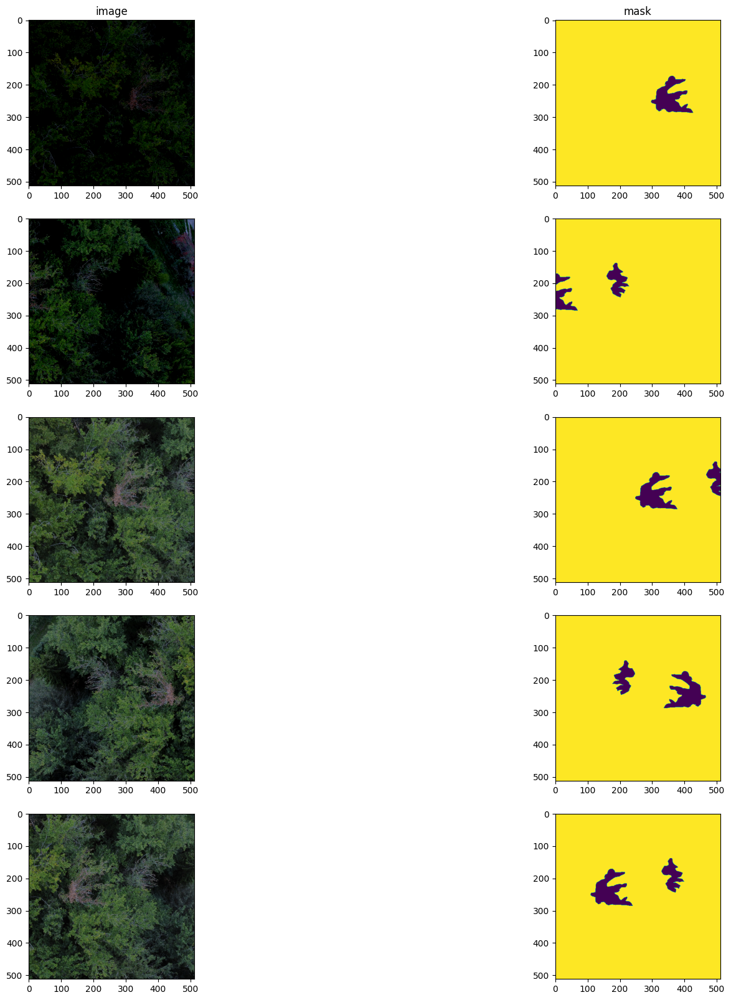

In [ ]:
if local:
  path = ""
else:
  path = "drive/MyDrive/"

image = cv2.imread(f'{path}/tree_segmentation/original/sick/image/DJI_0033.JPG')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask = cv2.imread(f'{path}/tree_segmentation/original/sick/mask/MaskDJI_0033.png', cv2.IMREAD_GRAYSCALE)

N = 5

f, ax = plt.subplots(N, 2, figsize=(20, 20))
ax[0][0].set_title("image")
ax[0][1].set_title("mask")

for i in range(N):
  HealthyMask = True
  while HealthyMask:
    transformed = transform(image=image,mask=mask)
    #run until at least 10% of pixels are of sick trees so we get an interesting image
    HealthyMask = np.sum(transformed['mask']!=255)>.1*image_size**2
  ax[i][0].imshow(transformed['image'])
  ax[i][1].imshow(transformed['mask'])

create lists of sick and healthy tree file names

In [ ]:
sick_images = glob.glob(f'{path}/tree_segmentation/original/sick/image/*.JPG')
sick_masks = glob.glob(f'{path}/tree_segmentation/original/sick/mask/*.png')
healthy_images = glob.glob(f'{path}/tree_segmentation/original/healthy/image/*.JPG')
healthy_masks = glob.glob(f'{path}/tree_segmentation/original/healthy/mask/*.png')

sick_images.sort()
sick_masks.sort()
healthy_images.sort()
healthy_masks.sort()

create our data set but don't include all healthy trees as there are to many

In [ ]:
total_sick = len(sick_images)
#add in some healthy images
total_healthy = len(healthy_images)
healthy_to_use = min(round(total_sick*.5),total_healthy)
healthy_idx = np.random.choice(total_healthy,healthy_to_use)
sickfilepaths = tf.data.Dataset.from_tensor_slices((sick_images,sick_masks))
healthyfilepaths = tf.data.Dataset.from_tensor_slices(([healthy_images[i] for i in healthy_idx],healthy_masks*healthy_to_use))

create our data loader

In [ ]:
def load_and_preprocess_image(image_path, mask_path):
    # Load the image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels=3, dtype=tf.uint8)
    #image = tf.image.convert_image_dtype(image, tf.float32)

    # Load and preprocess the mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_image(mask, channels=1, dtype=tf.uint8)
    mask = tf.image.convert_image_dtype(mask, tf.float32)
    mask = 1-tf.math.round(mask)  # Ensure binary mask (0 or 1) #invert mask

    return image, mask

load the image files into the dataset

In [ ]:
sickdataset = sickfilepaths.map(load_and_preprocess_image)
healthydataset = healthyfilepaths.map(load_and_preprocess_image)

create our validation and train data set but make sure they both have some amount of healthy and sick trees

In [ ]:
sickdataset = sickdataset.shuffle(100,seed=10)
healthydataset = healthydataset.shuffle(100,seed=10)

sick_train_dataset,sick_validation_dataset = tf.keras.utils.split_dataset(sickdataset,left_size=.8)
healthy_train_dataset,healthy_validation_dataset = tf.keras.utils.split_dataset(healthydataset,left_size=.8)

train_data_set = sick_train_dataset.concatenate(healthy_train_dataset)
validation_data_set = sick_train_dataset.concatenate(healthy_validation_dataset)

train_data_set = train_data_set.shuffle(100,seed=11)
validation_data_set = validation_data_set.shuffle(100,seed=11)


create functions that allow tensorflow to work with albumentations

In [ ]:
def apply_augmentation(image,mask):
  transformed = transform(image=image,mask=mask)
  aug_img = transformed["image"]
  aug_img = tf.cast(aug_img/255, tf.float32)
  aug_img = tf.image.resize(aug_img, size=[image_size, image_size])
  aug_mask = transformed["mask"]
  aug_mask = tf.cast(aug_mask, tf.float32)
  aug_mask = tf.image.resize(aug_mask, size=[image_size, image_size])
  return aug_img, aug_mask

def process_data(image, mask):
    aug_img, aug_mask = tf.numpy_function(func=apply_augmentation, inp=[image, mask], Tout=(tf.float32, tf.float32))
    aug_img.set_shape((image_size,image_size,3))
    aug_mask.set_shape((image_size,image_size,1))
    return aug_img, aug_mask

def apply_augmentation_test(image,mask):
  transformed = testtransform(image=image,mask=mask)
  aug_img = transformed["image"]
  aug_img = tf.cast(aug_img/255, tf.float32)
  aug_img = tf.image.resize(aug_img, size=[image_size, image_size])
  aug_mask = transformed["mask"]
  aug_mask = tf.cast(aug_mask, tf.float32)
  aug_mask = tf.image.resize(aug_mask, size=[image_size, image_size])
  return aug_img, aug_mask

def process_data_test(image, mask):
    aug_img, aug_mask = tf.numpy_function(func=apply_augmentation_test, inp=[image, mask], Tout=(tf.float32, tf.float32))
    aug_img.set_shape((image_size,image_size,3))
    aug_mask.set_shape((image_size,image_size,1))
    return aug_img, aug_mask

test the albumenations on an image

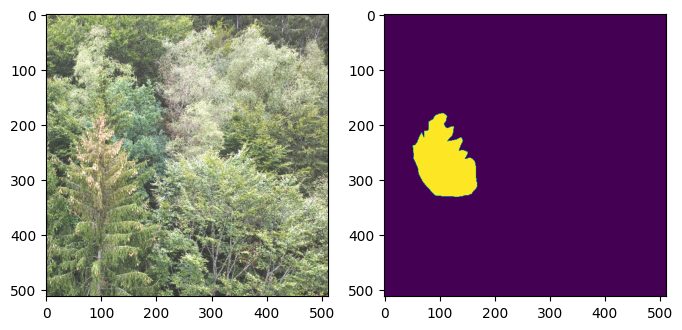

In [ ]:
augmented_dataset = sickdataset.map(process_data).batch(1).prefetch(AUTOTUNE)
def view_image(ds):
    image, mask = next(iter(ds)) # extract 1 batch from the dataset
    image = image.numpy()
    mask = mask.numpy()
    f, ax = plt.subplots(1, 2, figsize=(8, 8))
    ax[0].imshow(image[0])
    ax[1].imshow(mask[0])

view_image(augmented_dataset)

create test set so that it applies the albumentations transform and shuffles the order each time

In [ ]:
train_batches = (
    train_data_set
    .map(process_data)
    .cache()
    .shuffle(1000,seed=10)
    .batch(1)
    .repeat()
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = (
    validation_data_set
    .map(process_data_test)
    .cache()
    .shuffle(1000,seed=10)
    .batch(1))

add display function

In [ ]:
def display(display_list):
  plt.figure(figsize=(15, 15))
  titles = ['Original Image', 'Original Mask', 'Generated Mask', 'Heat Map']
  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(titles[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

test display function for a couple images

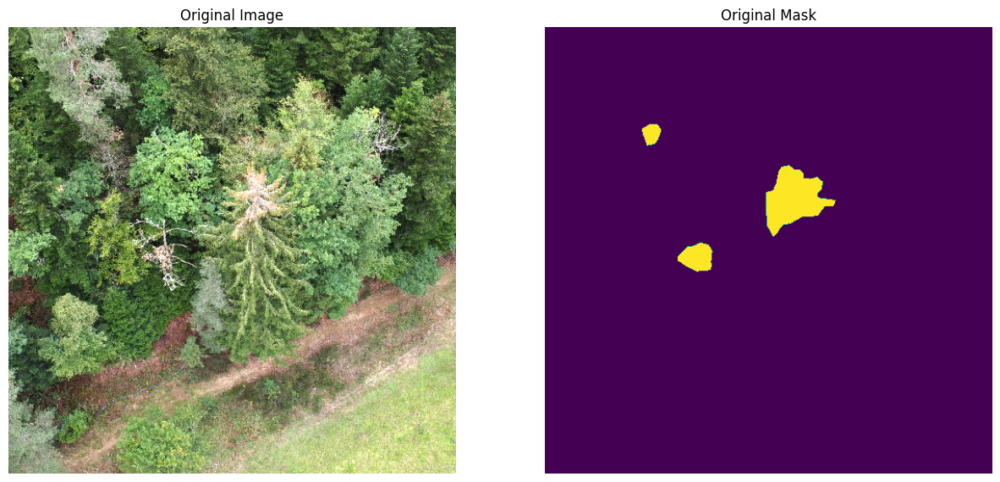

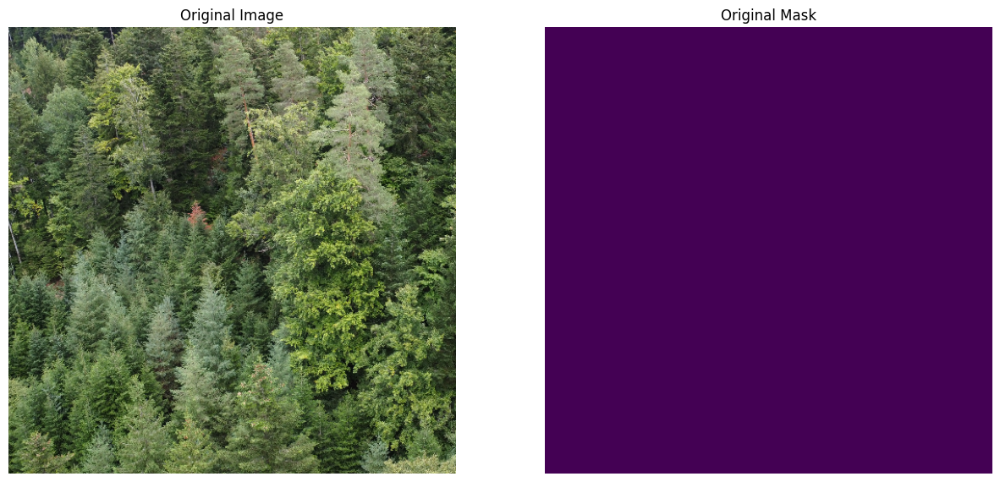

In [ ]:
for images, masks in train_batches.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])

install TASM

In [ ]:
!pip install git+https://github.com/JanMarcelKezmann/TensorFlow-Advanced-Segmentation-Models.git

  Cloning https://github.com/JanMarcelKezmann/TensorFlow-Advanced-Segmentation-Models.git to /tmp/pip-req-build-29gd5gs6
  Running command git clone --filter=blob:none --quiet https://github.com/JanMarcelKezmann/TensorFlow-Advanced-Segmentation-Models.git /tmp/pip-req-build-29gd5gs6
  Resolved https://github.com/JanMarcelKezmann/TensorFlow-Advanced-Segmentation-Models.git to commit 3714839ee49759b26e2b0ae3d3a0aa37b00df962
  Preparing metadata (setup.py) ... done


In [ ]:
import tensorflow_advanced_segmentation_models as tasm

Create the base resnet model

In [ ]:
BACKBONE_NAME = "resnet50v2"
WEIGHTS = "imagenet"

base_model, layers, layer_names = tasm.create_base_model(name=BACKBONE_NAME, weights=WEIGHTS, height=image_size, width=image_size)

Use the base model to create the full segmentation model with unet

In [ ]:
model = tasm.UNet(n_classes=2, base_model=base_model, output_layers=layers, backbone_trainable=False).model()

Compile the model with our loss function

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Generate picture of model structure

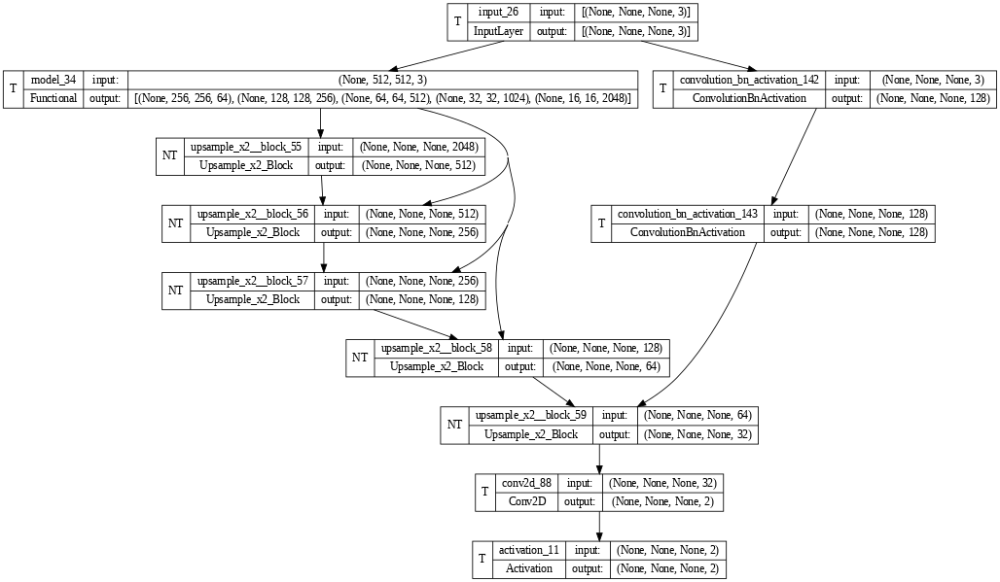

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True,dpi=60,show_layer_names=True,show_trainable=True)

Add functions to show predictions

In [ ]:
def create_mask(pred_mask):
  pred_mask = tf.math.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask

def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      try:
        display([image[0], mask[0], create_mask(pred_mask[0]), (pred_mask[:,:,:,1, tf.newaxis])[0]])
      except Exception as e:
        print(e)
  else:
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    display([sample_image, sample_mask,create_mask(pred_mask[0]), (pred_mask[:,:,:,1, tf.newaxis])[0]])

Create callback to show predictions as the model is running

In [ ]:
from IPython.display import clear_output

class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Run the model saving the checkpoint with the best loss

1/1 [==============================] - 0s 17ms/step


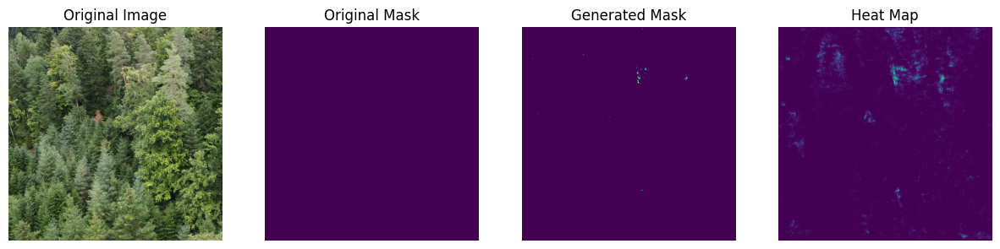


Sample Prediction after epoch 40


Epoch 40: val_loss improved from 0.06123 to 0.06031, saving model to segmentation_model2
31/31 [==============================] - 12s 387ms/step - loss: 0.0472 - accuracy: 0.9860 - val_loss: 0.0603 - val_accuracy: 0.9816


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
EPOCHS = 40

filepath = 'segmentation_model2'
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, \
                             save_best_only=True, save_weights_only=False, \
                             mode='auto', save_frequency=1)

model_history = model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=len(train_data_set),
                          validation_steps=len(validation_data_set),
                          validation_data=test_batches,
                          callbacks=[DisplayCallback(),checkpoint])

Show predictions on several batches

1/1 [==============================] - 1s 1s/step


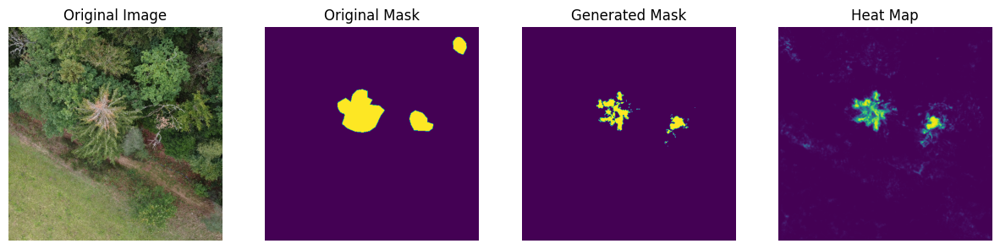

1/1 [==============================] - 0s 16ms/step


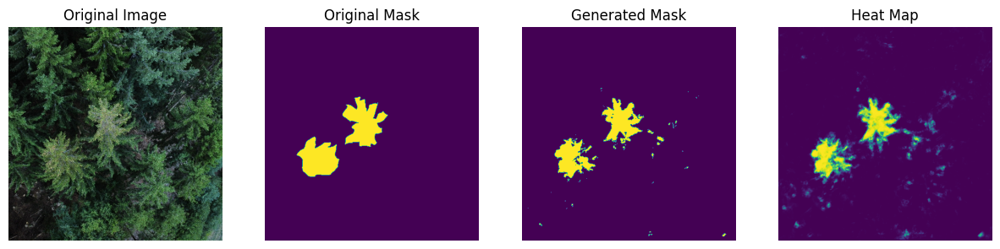

1/1 [==============================] - 0s 15ms/step


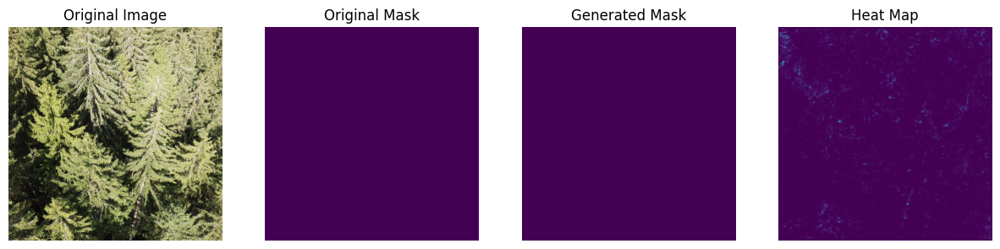

1/1 [==============================] - 0s 16ms/step


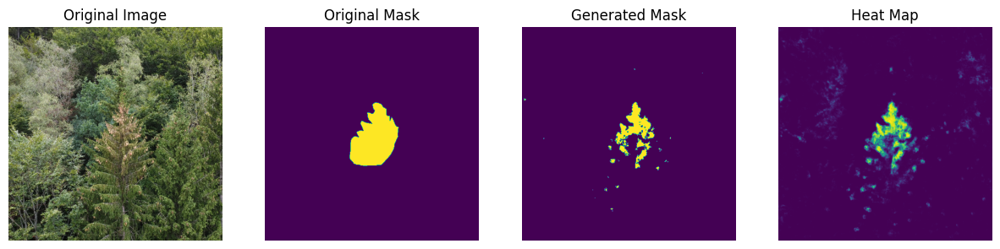

1/1 [==============================] - 0s 15ms/step


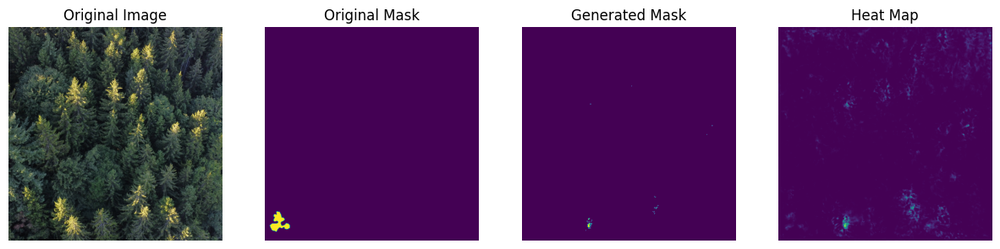

1/1 [==============================] - 0s 15ms/step


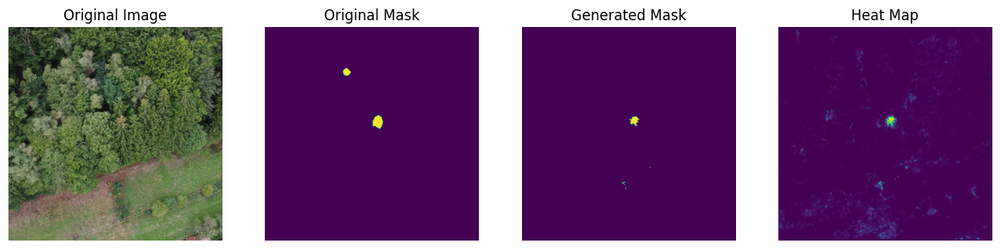

1/1 [==============================] - 0s 16ms/step


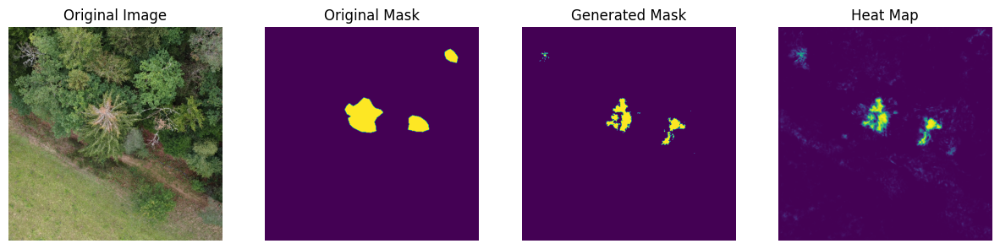

1/1 [==============================] - 0s 15ms/step


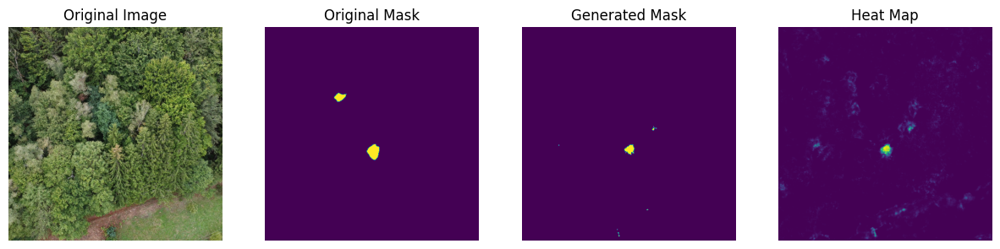

1/1 [==============================] - 0s 15ms/step


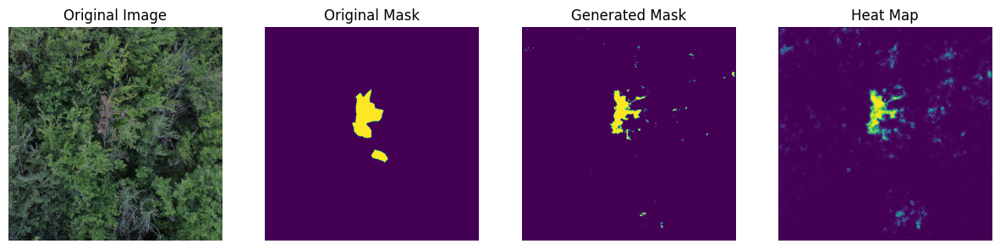

1/1 [==============================] - 0s 15ms/step


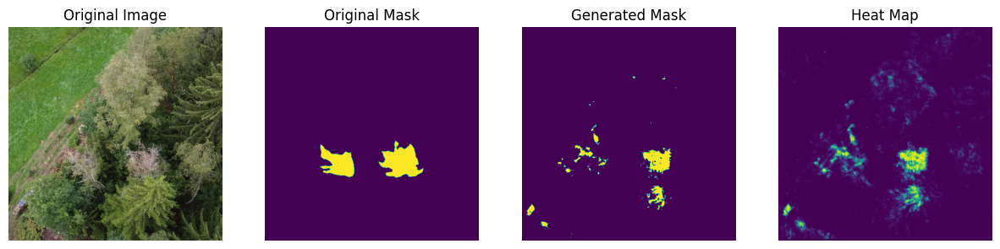

1/1 [==============================] - 0s 16ms/step


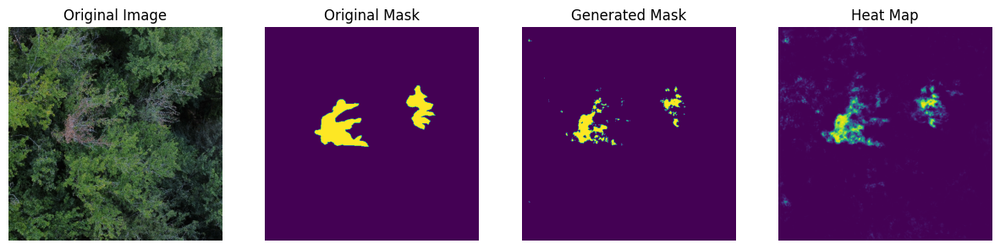

1/1 [==============================] - 0s 15ms/step


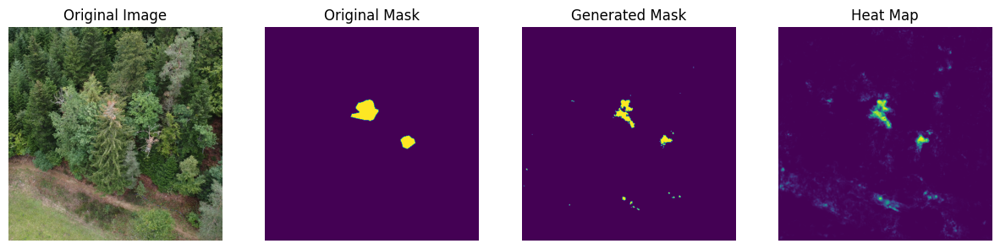

1/1 [==============================] - 0s 15ms/step


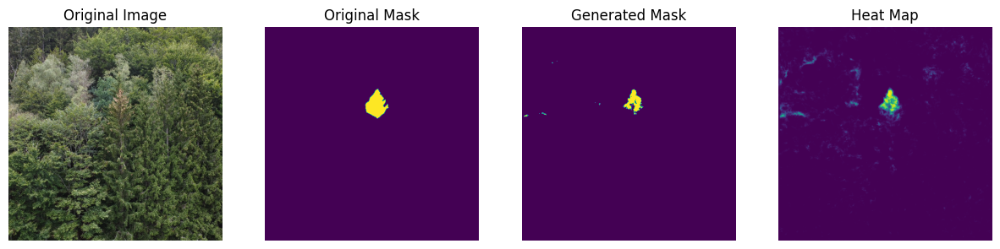

1/1 [==============================] - 0s 15ms/step


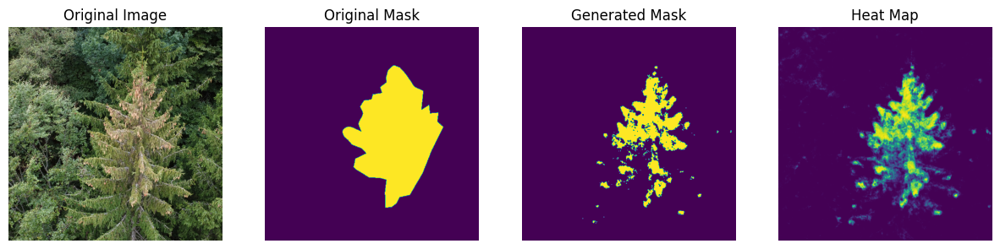

1/1 [==============================] - 0s 15ms/step


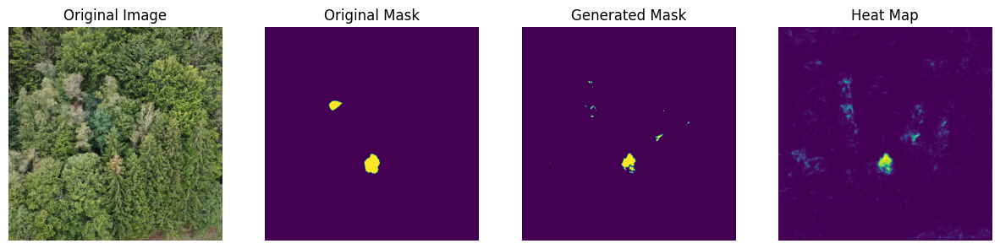

1/1 [==============================] - 0s 15ms/step


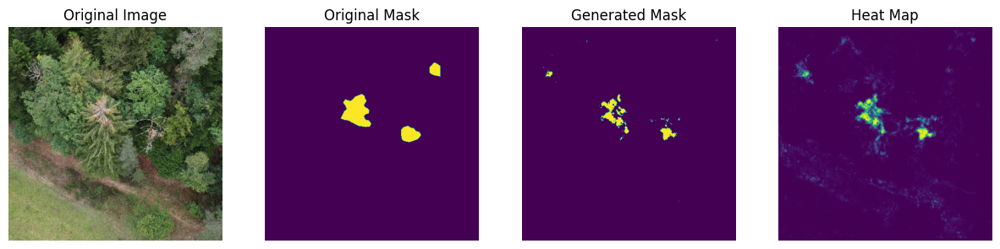

1/1 [==============================] - 0s 15ms/step


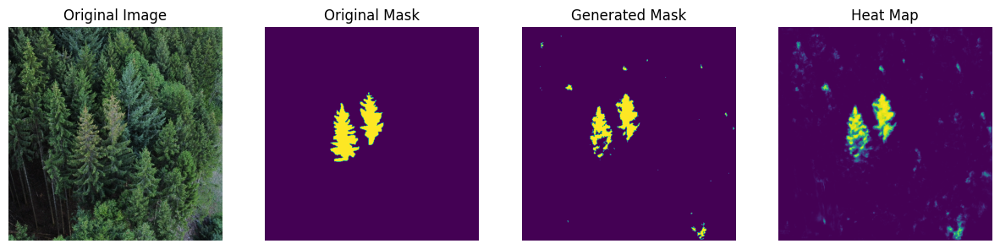

1/1 [==============================] - 0s 15ms/step


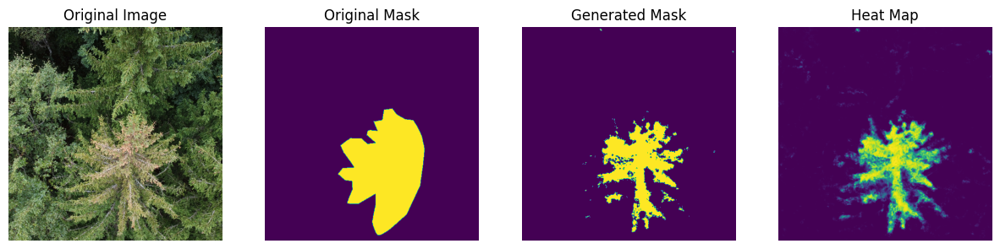

1/1 [==============================] - 0s 14ms/step


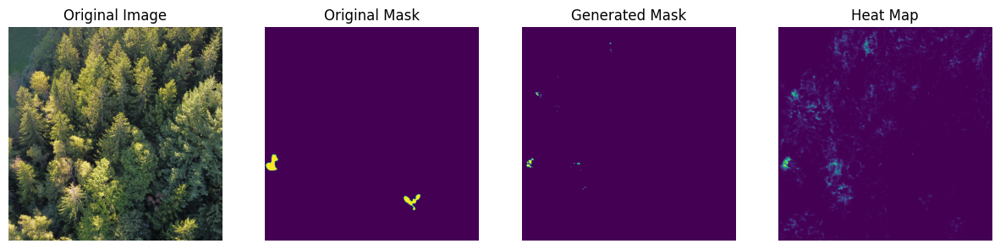

1/1 [==============================] - 0s 13ms/step


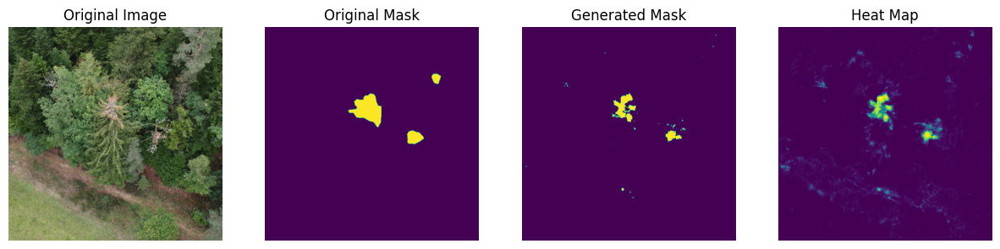

In [ ]:
from tensorflow.keras.models import load_model
model = load_model(filepath)
show_predictions(test_batches, 20)

create the full dataset

In [ ]:
random_seed = 20
dataset = sickdataset.concatenate(healthydataset)

performs kfolds cross validation on 10 folds

In [ ]:
nfolds = 10
EPOCHS = 30
datafolds =[]

for i in range(nfolds):
  datafolds.append(dataset.shard(nfolds,i))

val_loss = []
score  = []
#take one fold as the test validation set and the rest as the test set
for i in range(nfolds):
  test = datafolds[i]
  idx = [n for n in range(nfolds) if n!=i]
  train = datafolds[idx[0]]
  for n in idx[1:]:
    train = train.concatenate(datafolds[n])
  VALIDATION_STEPS=len(test)
  train_batches = (
      train
      .map(process_data)
      .cache()
      .shuffle(1000,seed=10)
      .batch(1)
      .repeat()
      .prefetch(buffer_size=tf.data.AUTOTUNE))

  test_batches = (
      test
      .map(process_data_test)
      .cache()
      .shuffle(1000,seed=10)
      .batch(1))

  #now run the model and collect scores
  model = tasm.UNet(n_classes=2, base_model=base_model, output_layers=layers, backbone_trainable=False).model()
  model.compile(optimizer='adam',
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])
  model_history = model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=len(train),
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches)
  val_loss.append(model_history.history['val_loss'])
  score.append(min(model_history.history['val_loss']))

Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


35/35 [==============================] - 14s 102ms/step - loss: 0.1228 - accuracy: 0.9754 - val_loss: 0.0676 - val_accuracy: 0.9834
Epoch 2/30
35/35 [==============================] - 2s 47ms/step - loss: 0.0757 - accuracy: 0.9807 - val_loss: 0.0566 - val_accuracy: 0.9835
Epoch 3/30
35/35 [==============================] - 2s 47ms/step - loss: 0.0644 - accuracy: 0.9822 - val_loss: 0.0470 - val_accuracy: 0.9863
Epoch 4/30
35/35 [==============================] - 2s 46ms/step - loss: 0.0608 - accuracy: 0.9831 - val_loss: 0.0482 - val_accuracy: 0.9852
Epoch 5/30
35/35 [==============================] - 2s 47ms/step - loss: 0.0607 - accuracy: 0.9832 - val_loss: 0.0521 - val_accuracy: 0.9848
Epoch 6/30
35/35 [==============================] - 2s 46ms/step - loss: 0.0609 - accuracy: 0.9820 - val_loss: 0.0539 - val_accuracy: 0.9850
Epoch 7/30
35/35 [==============================] - 2s 46ms/step - loss: 0.0549 - accuracy: 0.9847 - val_loss: 0.0453 - val_accuracy: 0.9866
Epoch 8/30
35/35 [====

create a box plot showing the loss

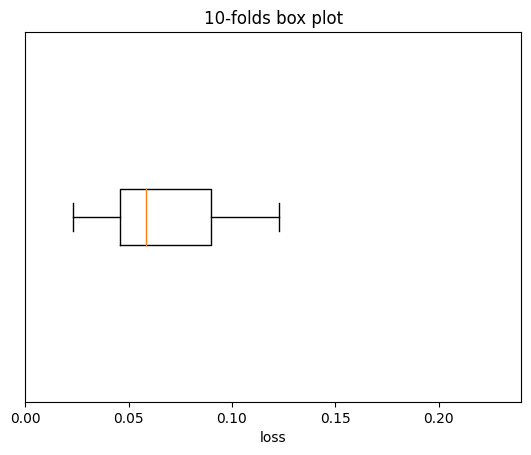

In [ ]:
plt.boxplot(score,vert=False)
plt.title("10-folds box plot")
plt.xlim(0, 0.24)
plt.xlabel("loss")
plt.yticks([])
plt.savefig('AlternativeModelBoxplot.png', dpi=300)

start of default model

Install the pix2pix example from tensorflow

In [ ]:
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-tp5u_pq6
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/examples.git /tmp/pip-req-build-tp5u_pq6
  Resolved https://github.com/tensorflow/examples.git to commit 0b14ce1c88537b94772cc99d995d936417be6f5d
  Preparing metadata (setup.py) ... done


Create the up statck from the pix2pix model

In [ ]:
from tensorflow_examples.models.pix2pix import pix2pix
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

use mobile net v2 as the backbown

In [ ]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[image_size, image_size, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

Create the unet architecture connecting the backbown to the upstack

In [ ]:
def unet_model(output_channels:int):
  inputs = tf.keras.layers.Input(shape=[image_size, image_size, 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=3, strides=2,
      padding='same')  #64x64 -> image_sizeximage_size

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Compile the model

In [ ]:
OUTPUT_CLASSES = 2

pixmodel = unet_model(output_channels=OUTPUT_CLASSES)
pixmodel.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

plot the model architecture

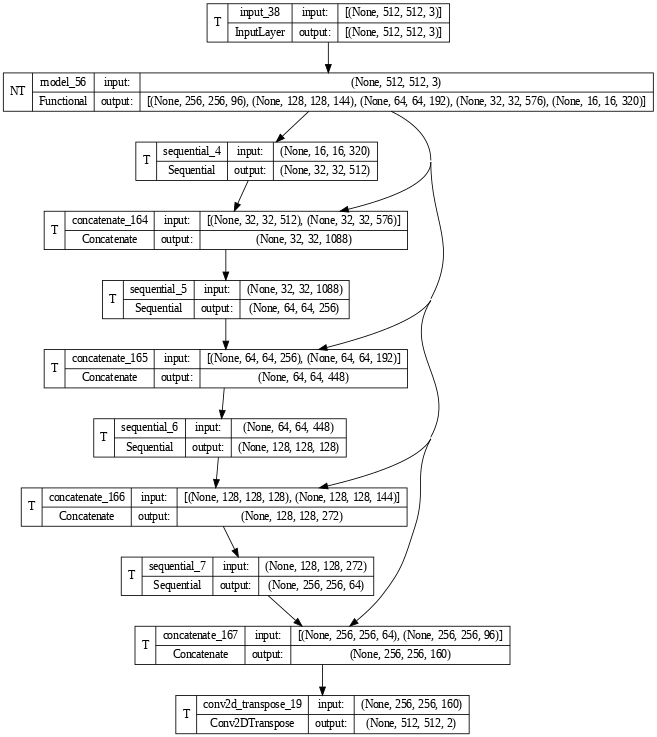

In [ ]:
tf.keras.utils.plot_model(pixmodel,show_shapes=True,dpi=60,show_layer_names=True,show_trainable=True)

set up the train and test set

In [ ]:
train_batches = (
    train_data_set
    .map(process_data)
    .cache()
    .shuffle(1000,seed=10)
    .batch(1)
    .repeat()
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = (
    validation_data_set
    .map(process_data_test)
    .cache()
    .shuffle(1000,seed=10)
    .batch(1))

run the model and save checkpoints

1/1 [==============================] - 0s 20ms/step


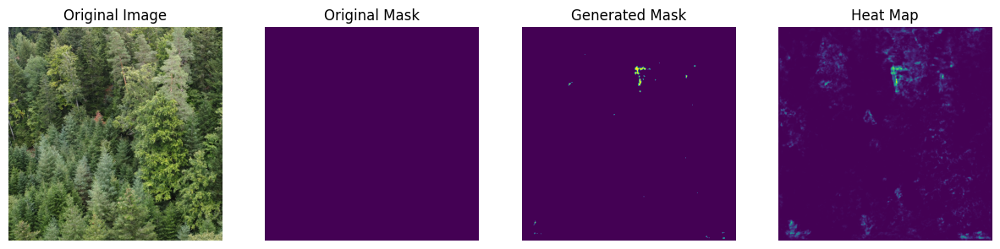


Sample Prediction after epoch 20


Epoch 20: val_loss did not improve from 0.05628
31/31 [==============================] - 1s 21ms/step - loss: 0.0316 - accuracy: 0.9887 - val_loss: 0.0652 - val_accuracy: 0.9778


In [ ]:
EPOCHS = 20
VALIDATION_STEPS = len(validation_data_set)

filepath = 'segmentation_model2.hdf5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, \
                             save_best_only=True, save_weights_only=False, \
                             mode='auto', save_frequency=1)

pix_model_history = pixmodel.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=len(train_data_set),
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches,
                          callbacks=[DisplayCallback(),checkpoint])

plot our model history

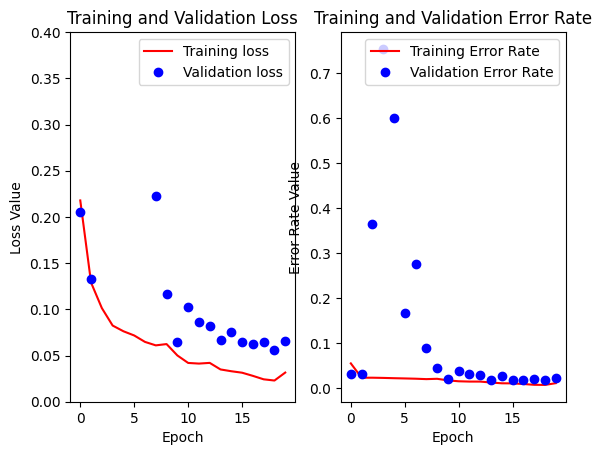

In [ ]:
loss = pix_model_history.history['loss']
val_loss = pix_model_history.history['val_loss']


plt.figure()
plt.subplot(121)
plt.plot(pix_model_history.epoch, loss, 'r', label='Training loss')
plt.plot(pix_model_history.epoch, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, .4])
plt.legend()

error = 1-np.array(pix_model_history.history['accuracy'])
val_error = 1-np.array(pix_model_history.history['val_accuracy'])
plt.subplot(122)
#plt.figure()
plt.plot(pix_model_history.epoch, error, 'r', label='Training Error Rate')
plt.plot(pix_model_history.epoch, val_error, 'bo', label='Validation Error Rate')
plt.title('Training and Validation Error Rate')
plt.xlabel('Epoch')
plt.ylabel('Error Rate Value')
#plt.ylim([8,. 1])
plt.legend()
plt.show()

load the model and show test batches

1/1 [==============================] - 0s 388ms/step


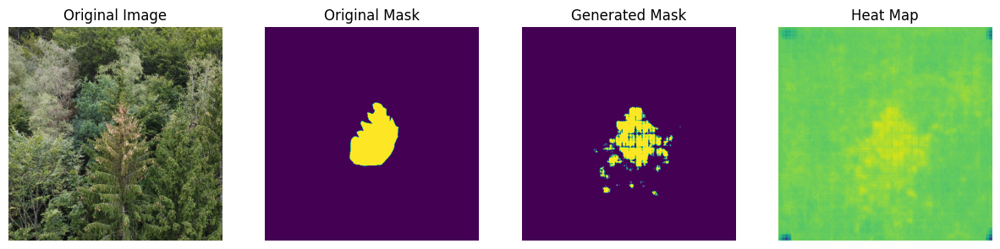

1/1 [==============================] - 0s 14ms/step


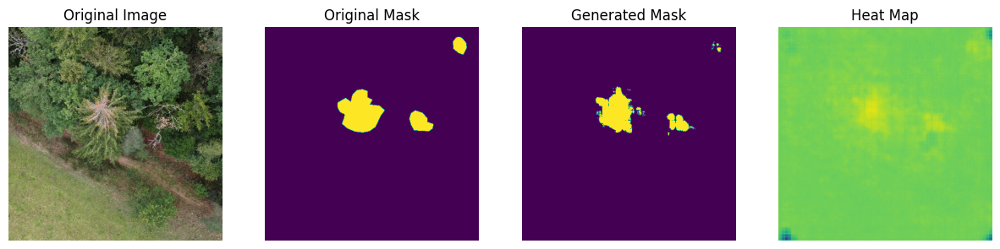

1/1 [==============================] - 0s 14ms/step


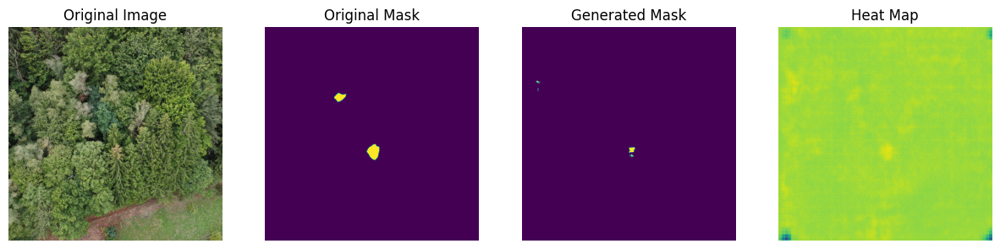

1/1 [==============================] - 0s 14ms/step


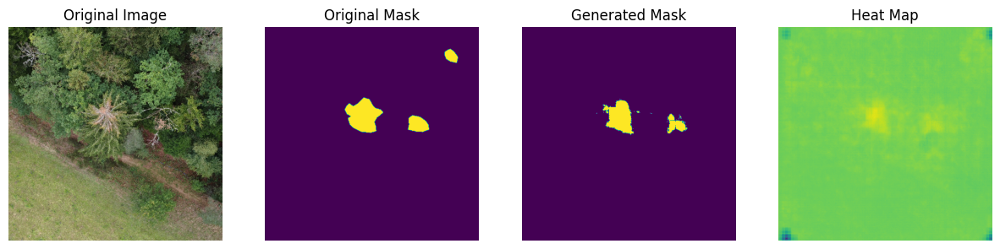

1/1 [==============================] - 0s 14ms/step


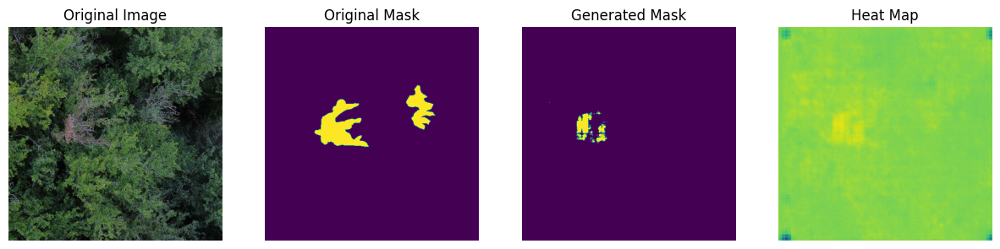

1/1 [==============================] - 0s 13ms/step


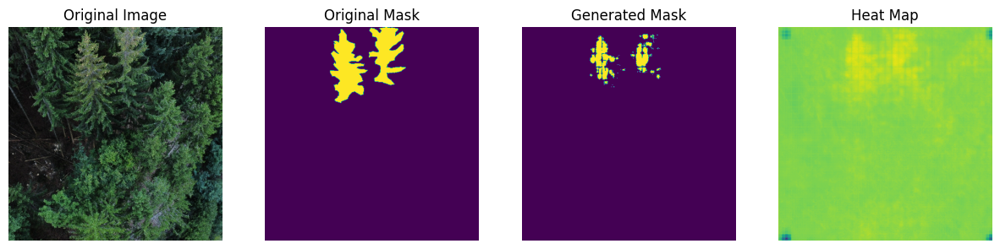

1/1 [==============================] - 0s 13ms/step


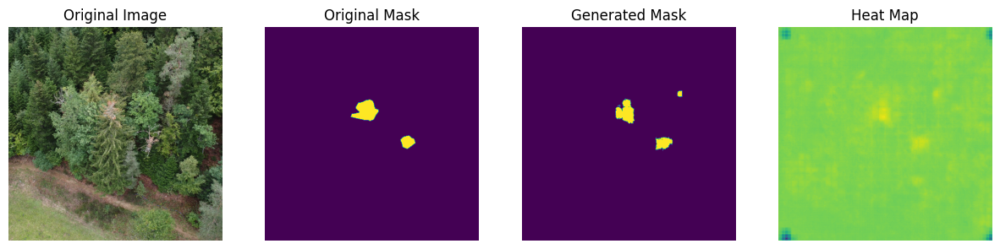

1/1 [==============================] - 0s 13ms/step


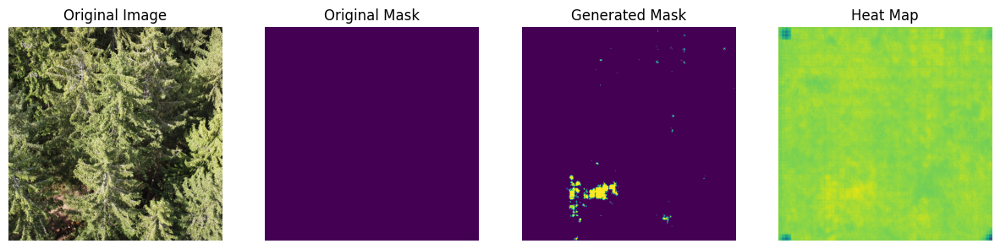

1/1 [==============================] - 0s 13ms/step


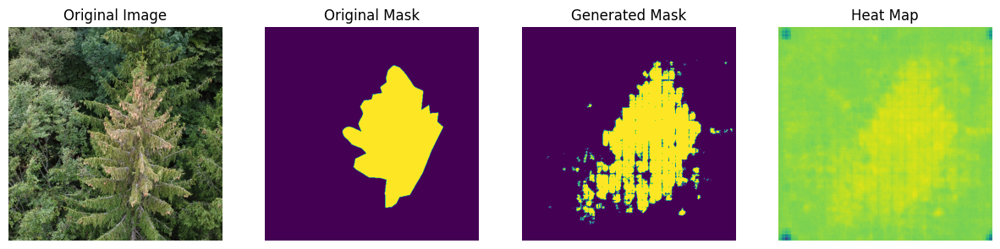

1/1 [==============================] - 0s 14ms/step


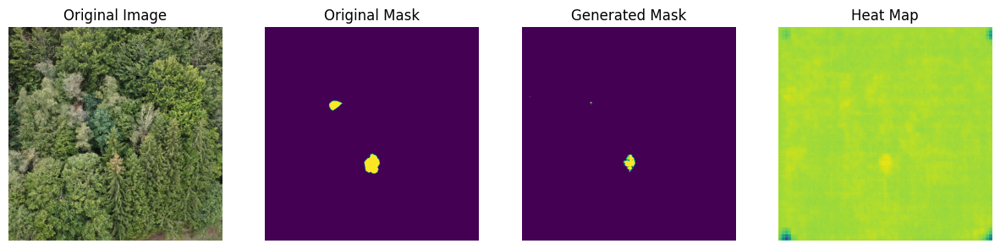

1/1 [==============================] - 0s 14ms/step


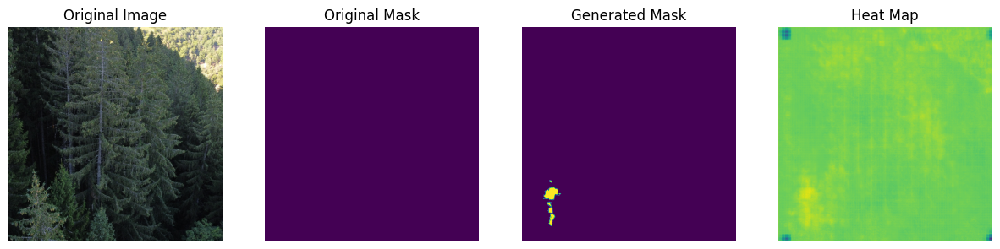

1/1 [==============================] - 0s 24ms/step


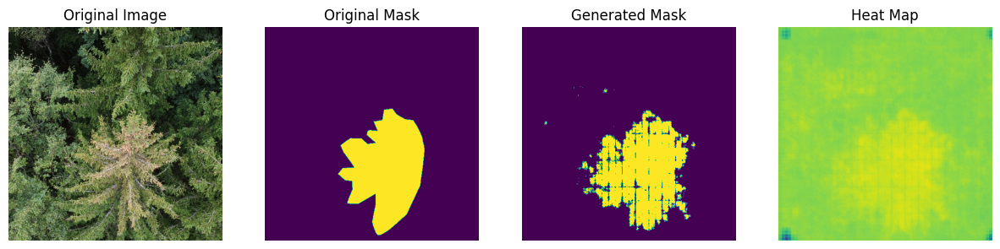

1/1 [==============================] - 0s 18ms/step


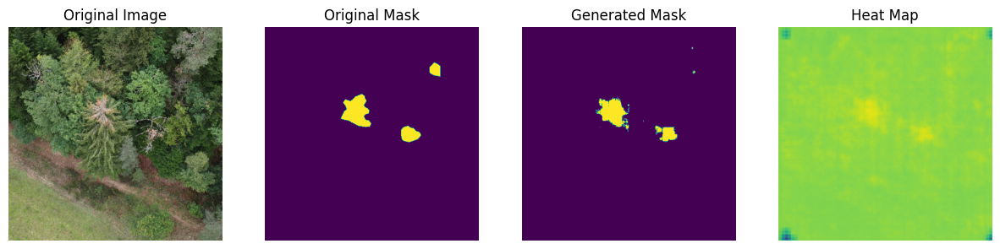

1/1 [==============================] - 0s 26ms/step


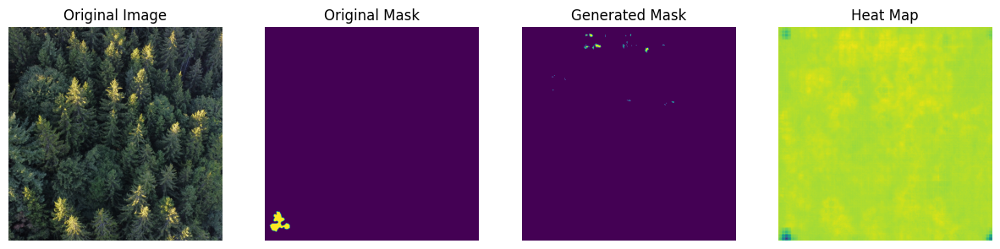

1/1 [==============================] - 0s 15ms/step


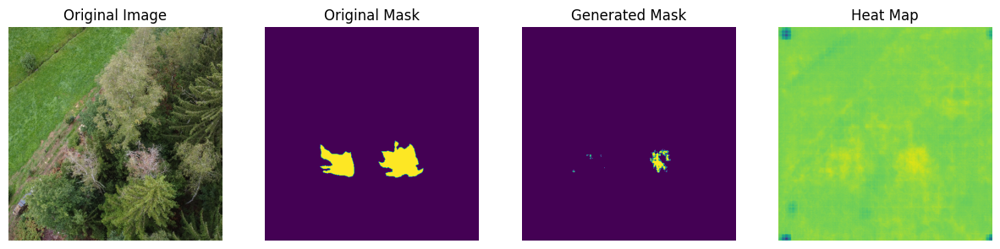

1/1 [==============================] - 0s 15ms/step


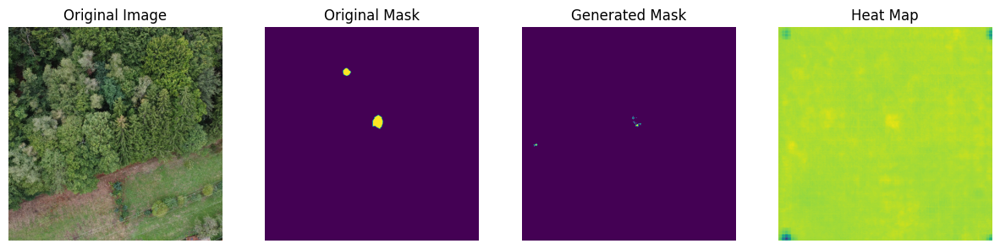

1/1 [==============================] - 0s 28ms/step


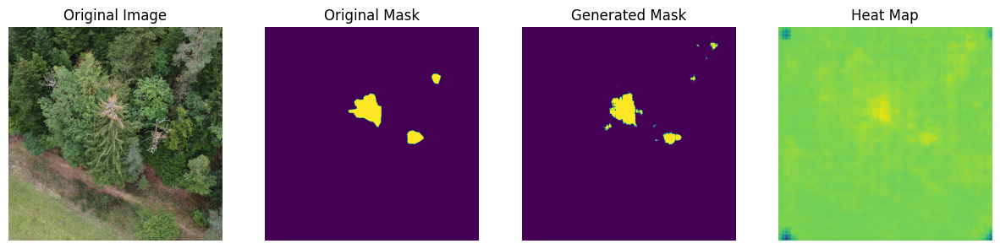

1/1 [==============================] - 0s 15ms/step


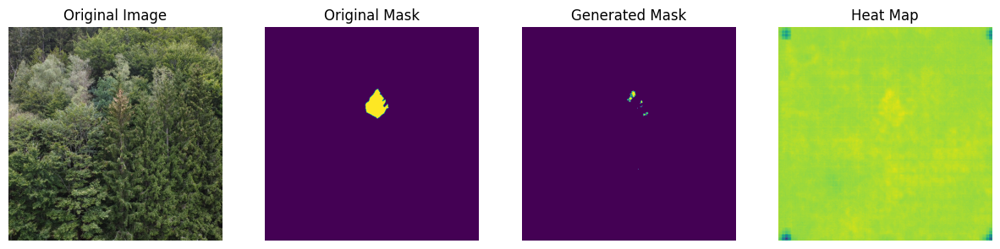

1/1 [==============================] - 0s 15ms/step


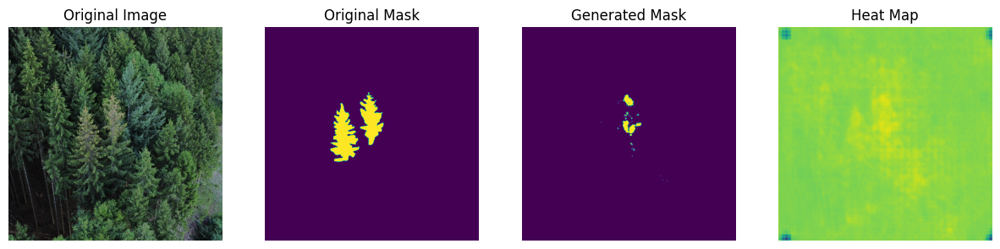

1/1 [==============================] - 0s 15ms/step


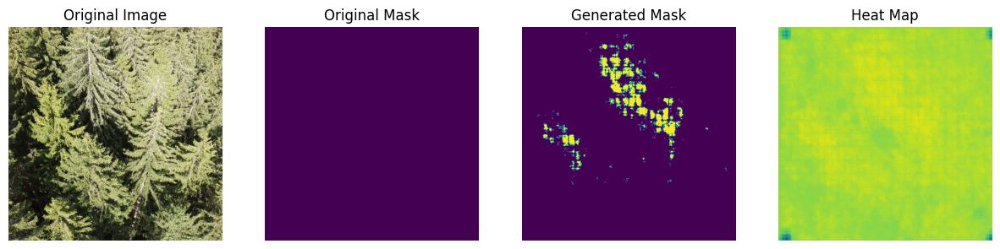

In [ ]:
model = load_model(filepath)
show_predictions(test_batches, 20)

run k folds cross validation

In [ ]:
random_seed = 20
nfolds = 10
EPOCHS = 30

datafolds =[]
#create the folds
for i in range(nfolds):
  datafolds.append(dataset.shard(nfolds,i))

val_loss = []
pix_score  = []
#take one fold as the test validation set and the rest as the test set
for i in range(nfolds):
  test = datafolds[i]
  trainlist = [datafolds[n] for n in range(nfolds) if n!=i]
  train = trainlist[0]
  for t in trainlist[1:]:
    train.concatenate(t)

  train_batches = (
      train
      .map(process_data)
      .cache()
      .shuffle(1000)
      .batch(1)
      .repeat()
      .prefetch(buffer_size=tf.data.AUTOTUNE))

  test_batches = (
      test
      .map(process_data_test)
      .cache()
      .shuffle(1000)
      .batch(1))

  VALIDATION_STEPS = len(test)

  #now run the model and collect scores
  model = unet_model(output_channels=OUTPUT_CLASSES)
  model.compile(optimizer='adam',
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])
  model_history = model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=len(train),
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches)
  val_loss.append(model_history.history['val_loss'])
  pix_score.append(min(model_history.history['val_loss']))

Epoch 1/30
4/4 [==============================] - 4s 322ms/step - loss: 0.7227 - accuracy: 0.6078 - val_loss: 0.2472 - val_accuracy: 0.9386
Epoch 2/30
4/4 [==============================] - 0s 16ms/step - loss: 0.2734 - accuracy: 0.9341 - val_loss: 0.1030 - val_accuracy: 0.9859
Epoch 3/30
4/4 [==============================] - 0s 15ms/step - loss: 0.2193 - accuracy: 0.9495 - val_loss: 0.0808 - val_accuracy: 0.9859
Epoch 4/30
4/4 [==============================] - 0s 14ms/step - loss: 0.2126 - accuracy: 0.9495 - val_loss: 0.0730 - val_accuracy: 0.9859
Epoch 5/30
4/4 [==============================] - 0s 15ms/step - loss: 0.1973 - accuracy: 0.9496 - val_loss: 0.0671 - val_accuracy: 0.9860
Epoch 6/30
4/4 [==============================] - 0s 15ms/step - loss: 0.1741 - accuracy: 0.9498 - val_loss: 0.0634 - val_accuracy: 0.9861
Epoch 7/30
4/4 [==============================] - 0s 14ms/step - loss: 0.1594 - accuracy: 0.9515 - val_loss: 0.0618 - val_accuracy: 0.9863
Epoch 8/30
4/4 [==========

create a box plot of the data

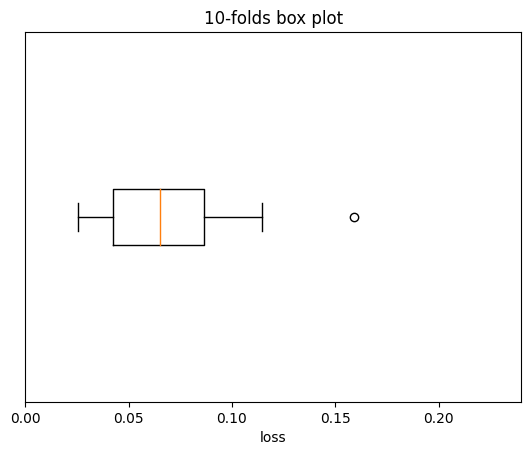

In [ ]:
plt.boxplot(pix_score,vert=False)
plt.title("10-folds box plot")
plt.xlim(0, 0.24)
plt.xlabel("loss")
plt.yticks([])
plt.savefig('AlternativeModelBoxplot.png', dpi=300)

combine box plots

Text(0.5, 1.0, '10 Folds Cross Validation')

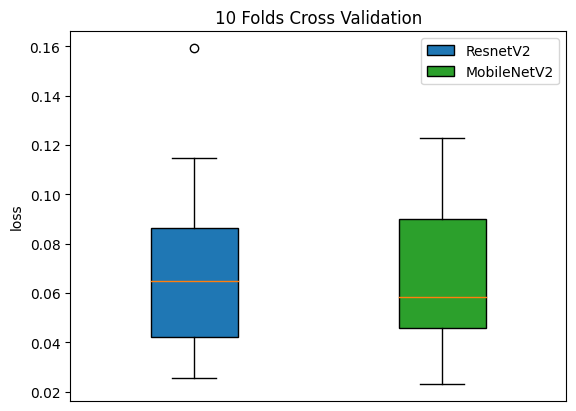

In [ ]:
data1=pix_score
data2=score

fig, ax = plt.subplots()
bp1 = ax.boxplot(data1, positions=[1], notch=False, widths=0.35,
                 patch_artist=True, boxprops=dict(facecolor="C0"))
bp2 = ax.boxplot(data2, positions=[2], notch=False, widths=0.35,
                 patch_artist=True, boxprops=dict(facecolor="C2"))

ax.legend([bp1["boxes"][0], bp2["boxes"][0]], ['ResnetV2', 'MobileNetV2'], loc='upper right')

ax.set_xlim(.5,2.5)
ax.set_xticks([])
ax.set_ylabel("loss")
ax.set_title("10 Folds Cross Validation")

print out average scores

In [ ]:
print(f"average MobileNetV2 = {sum(pix_score)/nfolds}, average ResnetV2 = {sum(score)/nfolds}")

average MobileNetV2 = 0.07094207126647234, average ResnetV2 = 0.0657370848581195
